In [1]:
import os
import time
import numpy as np
import pandas as pd

import torch.nn.functional as F

from utils.posthoc.basic import *
from utils.posthoc.plots import *
from utils.posthoc.modify_bagnet import *

In [2]:
data_dir = "files/images/"
df_test = pd.read_csv('files/csv_files/kaggle_gradable_test.csv')

## Load configuration file

In [3]:
device = 'cuda'
config_file = './configs/default.yaml'
path = './configs/paths.yaml'
cfg = load_conf_file(config_file, path)

hostname:  c9a6a71caefe


# Binary Onset2 (referable) task
NB: download the corresponding model weights  

In [4]:
cfg.data.num_classes = 2

## Load models

In [5]:
resnet_weights = '../model_weights/bin_onset2_resnet_best_validation_weights_acc.pt'
bagnet_dense_weights = '../model_weights/bin_onset2_dense_bagnet_best_validation_weights_acc.pt'
bagnet_sparse_weights = '../model_weights/bin_onset2_sparse_bagnet_best_validation_weights_acc.pt'

In [6]:
# resnet50
baseline_resnet = load_resnet(cfg, resnet_weights)

In [7]:
# bagnet
dense_bagnet = load_bagnet(cfg, bagnet_dense_weights)
sparse_bagnet = load_bagnet(cfg, bagnet_sparse_weights)         # 1e-5

## Figure2
- row1: `23541_rightrow`
- row2: `4385_right` 
- row3: `16552_right` 

img name: 4385_right.png, max: 1.0, min: 0.0, shape: (3, 3, 512, 512), type: <class 'numpy.ndarray'>


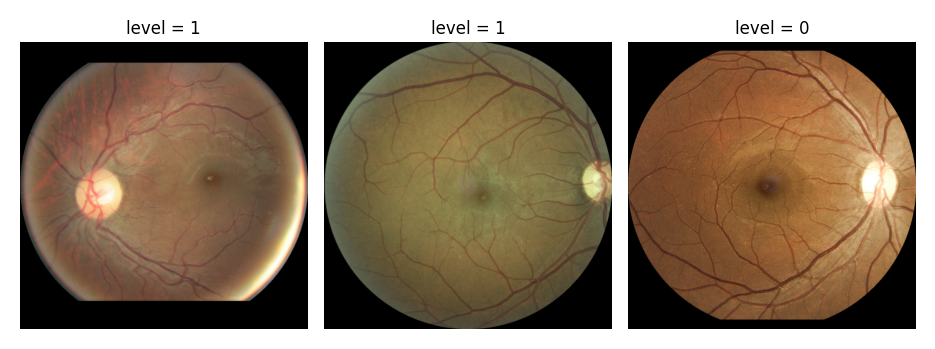

In [8]:
images_name = ['16552_right', '4385_right', '23541_right']
df_tmps = df_test[df_test.image.isin(images_name)]
df_tmp, labels = df_tmps['filename'], df_tmps['onset2'].tolist() 

images = load_EyePAC(data_dir, df_tmp, tensor=False)     # load the image and get corresponding array (b,C,H,W) /tensor (PIL) 
images_plot  = plot_transform(cfg, images, tensor=False)      # resize, (ToTensor/), CenterCrop

print('img name: {}, max: {}, min: {}, shape: {}, type: {}'.format(df_tmp.iloc[0], np.max(images[0]), np.min(images[0]), images.shape, type(images)))
plot_EyePACS(images_plot, labels, size=(6, 6))

### Inference

In [9]:
ts_img = test_transform(cfg, images, pil_tensor=False) #resize, ToTensor->range(0,1), CenterCrop, Normalization
ts_img = ts_img.float() # from torch.DoubleTensor to torch.FloatTensor
ts_img = ts_img.to(device)
print(ts_img.shape)

res_preds = F.softmax(baseline_resnet(ts_img).data.cpu(), 1)
dense_bagnet_pred  = F.softmax(dense_bagnet(ts_img).data.cpu(), 1)  
sparse_bagnet_pred = F.softmax(sparse_bagnet(ts_img).data.cpu(), 1) 

torch.Size([3, 3, 512, 512])


### Probability plots 

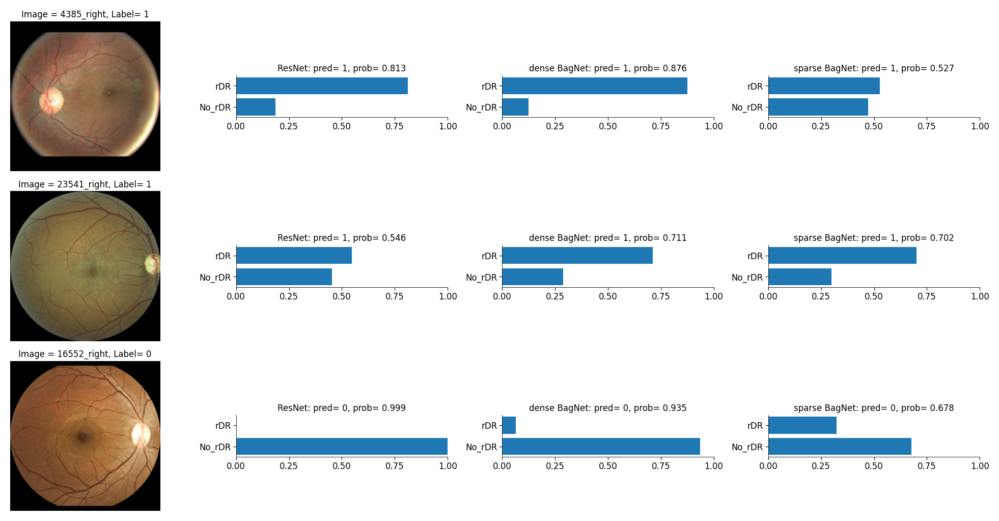

In [10]:
font_size = 12
ylabel = ['No_rDR', 'rDR']
proba = [res_preds, dense_bagnet_pred, sparse_bagnet_pred]
description = ['ResNet', 'dense BagNet', 'sparse BagNet']
result = plot_probabilities(images_plot, df_tmps, proba, description, binary=True, on_same_plot=False, size=(10,5))

### Class evidence map vs GradCAM

In [11]:
mode = ['bilinear', 'nearest']
dense_sparse_model = {'dense':dense_bagnet, 'sparse': sparse_bagnet}
heatmap, preds = get_feature_maps_from_inference(dense_sparse_model, ts_img)
image_plot_ts_img = [images_plot, ts_img]
ylabel = ['referable DR', 'referable DR', 'healthy']
# dense_result => images dense_feature_map -> class wise feature bagnet fmap
dense_result, sparse_result, resnet_result = get_bagnet_heatmap_and_GradCAM(baseline_resnet, heatmap, image_plot_ts_img, mode='bilinear', 
                                                                                    cmap='RdBu_r', dilation=0.5, percentile=99, alpha=.25)

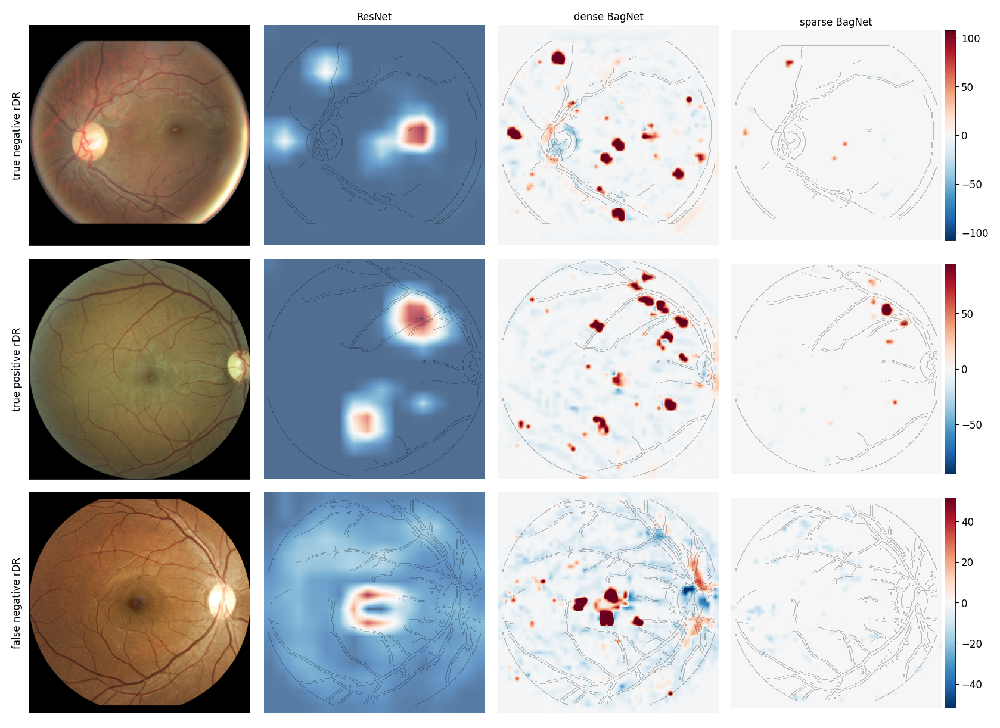

In [12]:
size = (8, 6)

results = (dense_result[0], sparse_result[0], resnet_result)
ylabel = ['true negative rDR', 'true positive rDR', 'false negative rDR', 'false positive rDR']
plot_binary_GradCAM_heatmap(images_plot, results, df_tmps, ylabel, result, plot_prob=False, size=size, bag_alpha=.25, cam_alpha=.7)
#plt.savefig('save/3.png',  format="png")

## Figure3
- col1: `5139_left`
- col2: `30295_right` 

The annotated images are not yet publicly available

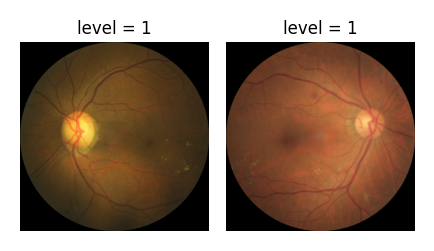

In [13]:
images_name = ['5139_left', '30295_right']
df_tmps = df_test[df_test.image.isin(images_name)]
df_tmp, labels = df_tmps['filename'], df_tmps['onset2'].tolist() 

images = load_EyePAC(data_dir, df_tmp, tensor=False)     
images_plot  = plot_transform(cfg, images, tensor=False)     

plot_EyePACS(images_plot, labels, size=(3,3))

### Inference

In [14]:
ts_img = test_transform(cfg, images, pil_tensor=False) #resize, ToTensor->range(0,1), CenterCrop, Normalization
ts_img = ts_img.float() # from torch.DoubleTensor to torch.FloatTensor
ts_img = ts_img.to(device)
print(ts_img.shape)

res_preds = F.softmax(baseline_resnet(ts_img).data.cpu(), 1)
dense_bagnet_pred  = F.softmax(dense_bagnet(ts_img).data.cpu(), 1)  
sparse_bagnet_pred = F.softmax(sparse_bagnet(ts_img).data.cpu(), 1) 

torch.Size([2, 3, 512, 512])


### Probability plots 

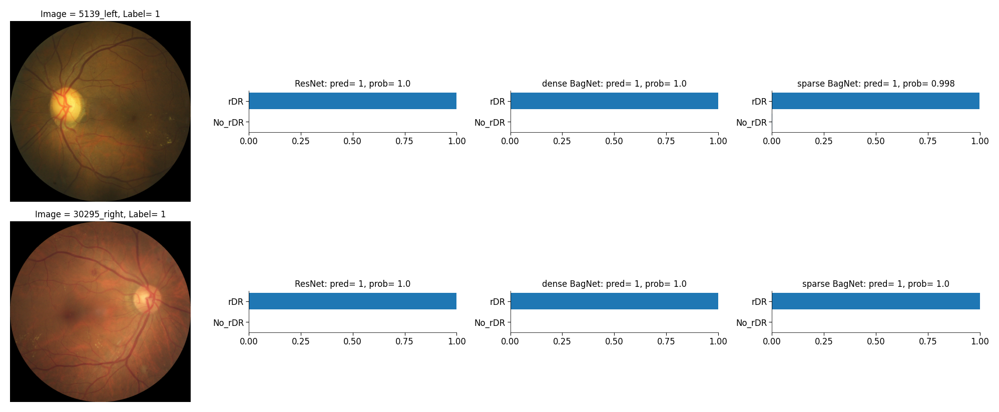

In [15]:
ylabel = ['No_rDR', 'rDR']
proba = [res_preds, dense_bagnet_pred, sparse_bagnet_pred]
description = ['ResNet', 'dense BagNet', 'sparse BagNet']
result = plot_probabilities(images_plot, df_tmps, proba, description, binary=True, on_same_plot=False, size=(10,4))

In [16]:
dense_sparse_model = {'dense':dense_bagnet, 'sparse': sparse_bagnet}
heatmap, preds = get_feature_maps_from_inference(dense_sparse_model, ts_img)
sparse_fmap = heatmap['sparse']
print(sparse_fmap.shape)

(2, 2, 60, 60)


In [17]:
len(sparse_fmap[0])
sparse_fmap[0][1].shape

(60, 60)

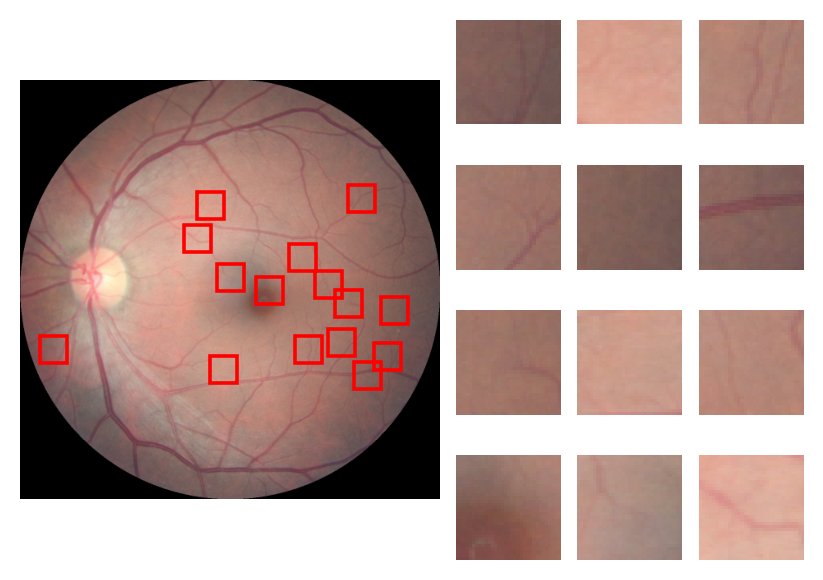

In [41]:
fig_size=(4, 4)
img_nber = 0
plot_localization(cfg, images_plot[0], sparse_fmap[img_nber][1], data_dir, annotated_img=None, fig_size=fig_size, k=16, print_score=False)

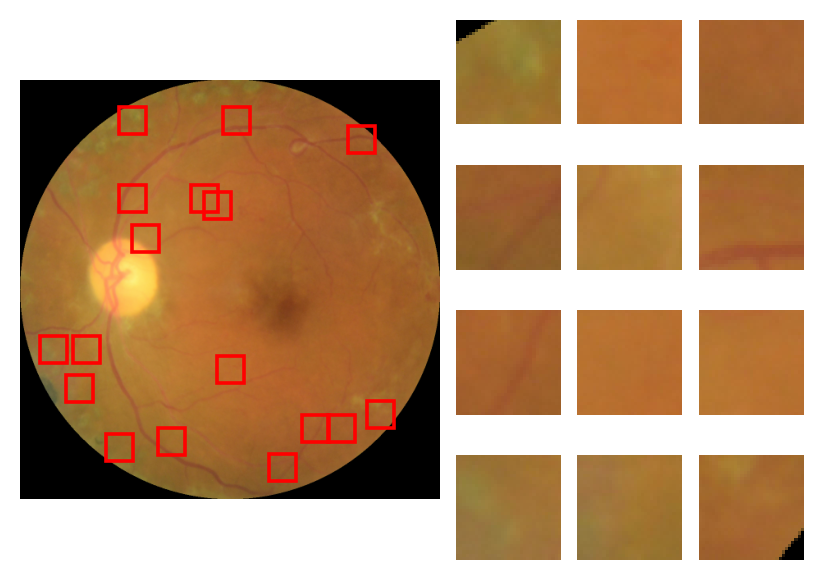

In [42]:
fig_size=(4,4)
img_nber = 1
plot_localization(cfg, images_plot[1], sparse_fmap[img_nber][1], data_dir, annotated_img=None, fig_size=fig_size, k=16, print_score=False)

## Figure6: appendix
- row1: `FN 8158_left` 
- row2: `FP 28936_left`  
- row3: `TN 650_left`   
- row4: `TP 15523_left`  

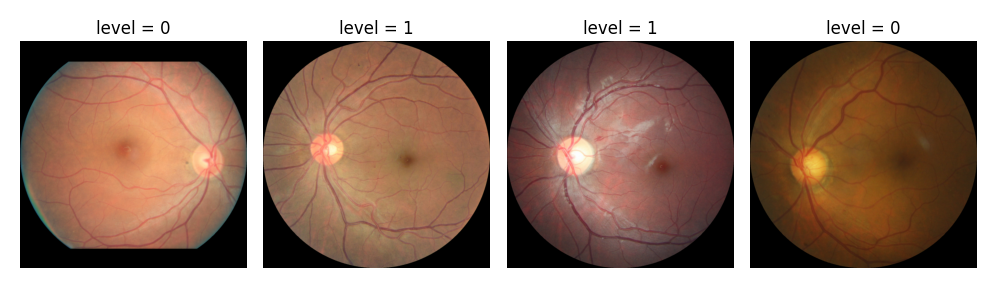

In [20]:
images_name = ['8158_left', '28936_left', '650_left', '15523_left']
df_tmps = df_test[df_test.image.isin(images_name)]
df_tmp, labels = df_tmps['filename'], df_tmps['onset2'].tolist() 

images = load_EyePAC(data_dir, df_tmp, tensor=False)     
images_plot  = plot_transform(cfg, images, tensor=False)     

plot_EyePACS(images_plot, labels, size=(6,6))

### Inference

In [21]:
ts_img = test_transform(cfg, images, pil_tensor=False) #resize, ToTensor->range(0,1), CenterCrop, Normalization
ts_img = ts_img.float() # from torch.DoubleTensor to torch.FloatTensor
ts_img = ts_img.to(device)
print(ts_img.shape)

res_preds = F.softmax(baseline_resnet(ts_img).data.cpu(), 1)
dense_bagnet_pred  = F.softmax(dense_bagnet(ts_img).data.cpu(), 1)  
sparse_bagnet_pred = F.softmax(sparse_bagnet(ts_img).data.cpu(), 1) 

torch.Size([4, 3, 512, 512])


### Probability plots 

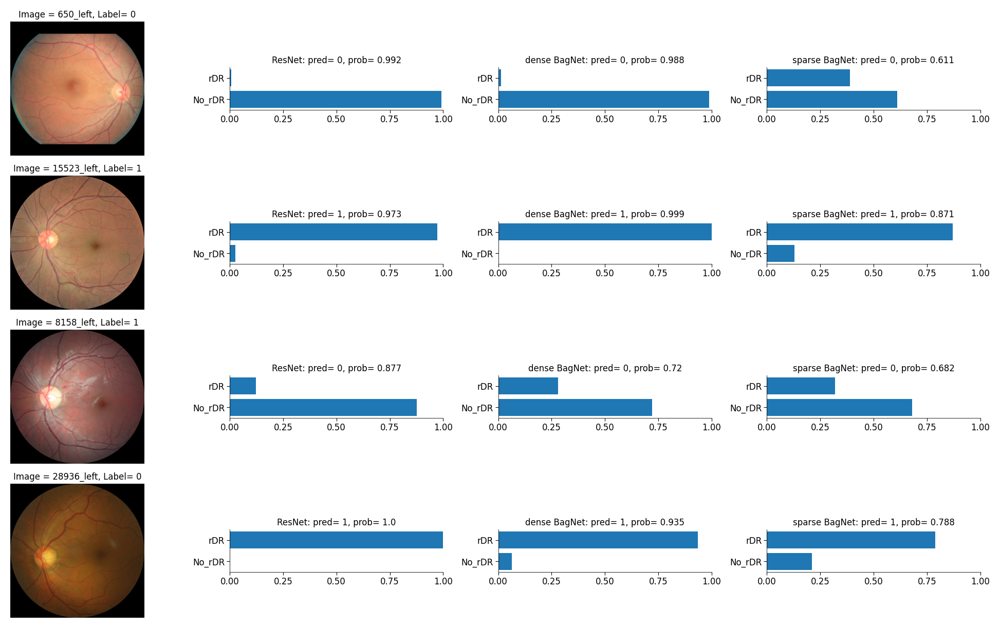

In [22]:
ylabel = ['No_rDR', 'rDR']
proba = [res_preds, dense_bagnet_pred, sparse_bagnet_pred]
description = ['ResNet', 'dense BagNet', 'sparse BagNet']
result = plot_probabilities(images_plot, df_tmps, proba, description, binary=True, on_same_plot=False, size=(10,6))

### Class evidence map vs GradCAM

In [23]:
mode = ['bilinear', 'nearest']
dense_sparse_model = {'dense':dense_bagnet, 'sparse': sparse_bagnet}
heatmap, preds = get_feature_maps_from_inference(dense_sparse_model, ts_img)
image_plot_ts_img = [images_plot, ts_img]

# dense_result => images dense_feature_map -> class wise feature bagnet fmap
dense_result, sparse_result, resnet_result = get_bagnet_heatmap_and_GradCAM(baseline_resnet, heatmap, image_plot_ts_img, mode='bilinear', 
                                                                                    cmap='RdBu_r', dilation=0.5, percentile=99, alpha=.25)

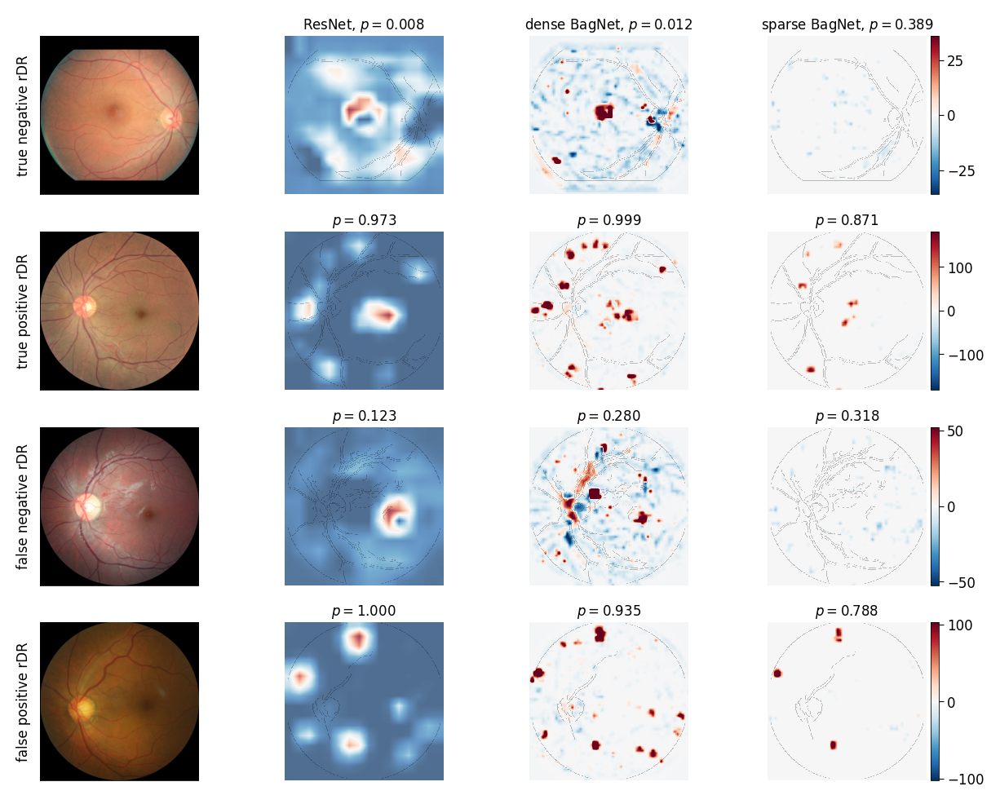

In [24]:
size = (6, 4.8)

results = (dense_result[0], sparse_result[0], resnet_result)
ylabel = ['true negative rDR', 'true positive rDR', 'false negative rDR', 'false positive rDR']
plot_binary_GradCAM_heatmap(images_plot, results, df_tmps, ylabel, result,  plot_prob=True, size=size, bag_alpha=.25, cam_alpha=.7)
#plt.savefig('appendix_heatmaps.pdf',  format="pdf")  #appendix_heatmaps

# Multiclass task

In [25]:
cfg.data.num_classes = 5

## Load models

In [26]:
# resnet50
resnet_weights = '../model_weights/mullti_class_resnet_best_validation_weights_acc.pt'
baseline_resnet = load_resnet(cfg, resnet_weights)

In [27]:
bagnet_dense_weights = '../model_weights/mullti_class_dense_bagnet_best_validation_weights_acc.pt'
bagnet_sparse_weights = '../model_weights/mullti_class_sparse_bagnet_best_validation_weights_acc.pt'

dense_bagnet = load_bagnet(cfg, bagnet_dense_weights)
sparse_bagnet = load_bagnet(cfg, bagnet_sparse_weights)         # 1e-6  

## Figure4 
- `42788_right`

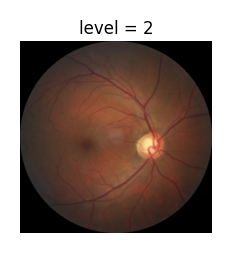

In [28]:
images_name = ['42788_right']
df_tmps = df_test[df_test.image.isin(images_name)]
df_tmp, labels = df_tmps['filename'], df_tmps['level'].tolist() 

images = load_EyePAC(data_dir, df_tmp, tensor=False)     
images_plot  = plot_transform(cfg, images, tensor=False)     

plot_EyePACS(images_plot, labels, size=(2,2))

In [29]:
ts_img = test_transform(cfg, images, pil_tensor=False) #resize, ToTensor->range(0,1), CenterCrop, Normalization
ts_img = ts_img.float() # from torch.DoubleTensor to torch.FloatTensor
ts_img = ts_img.to(device)
print(ts_img.shape)

res_preds = F.softmax(baseline_resnet(ts_img).data.cpu(), 1)
dense_bagnet_pred  = F.softmax(dense_bagnet(ts_img).data.cpu(), 1)  
sparse_bagnet_pred = F.softmax(sparse_bagnet(ts_img).data.cpu(), 1) 

torch.Size([1, 3, 512, 512])


### Probability plots 

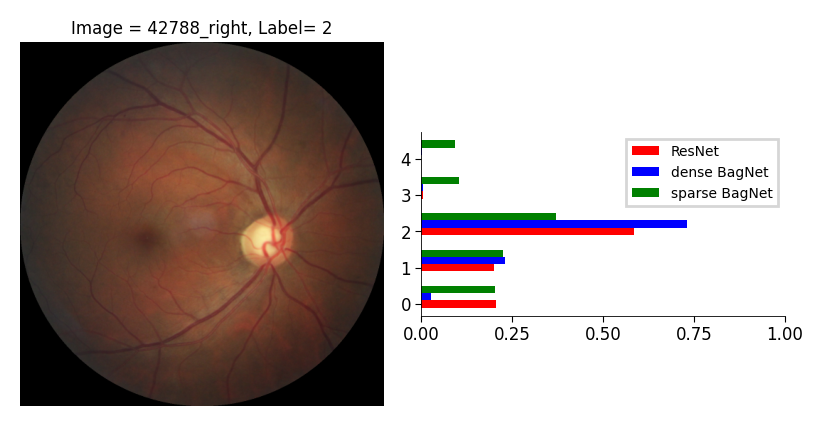

In [30]:
proba = [res_preds, dense_bagnet_pred, sparse_bagnet_pred]
description = ['ResNet', 'dense BagNet', 'sparse BagNet']
result = plot_probabilities(images_plot, df_tmps, proba, description, binary=False, on_same_plot=True, size=(4,4))
#plt.savefig('proba.pdf',  format="pdf") 

In [31]:
mode = ['bilinear', 'nearest']
dense_sparse_model = {'dense':dense_bagnet, 'sparse': sparse_bagnet}
heatmap, preds = get_feature_maps_from_inference(dense_sparse_model, ts_img)
image_plot_ts_img = [images_plot, ts_img]

# dense_result => images dense_feature_map -> class wise feature bagnet fmap
dense_result, sparse_result, resnet_result = get_bagnet_heatmap_and_GradCAM(baseline_resnet, heatmap, image_plot_ts_img, mode='bilinear', 
                                                                                    cmap='RdBu_r', dilation=0.5, percentile=99, alpha=.25)

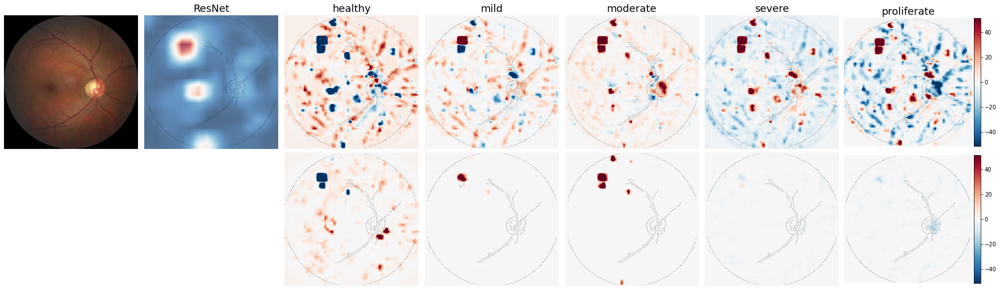

In [32]:
fs = 18
size = (24, 7)

results = (dense_result[0], sparse_result[0], resnet_result)
plot_multi_class_GradCAM_heatmap(images_plot, results, df_tmps, size=size, color_map=True, bag_alpha=.25, cam_alpha=.7, font_size=fs)

## Figure7: appendix
- row1: `6581_left` 
- row2: `3028_left`  
- row3: `26127_right`   
- row4: `17355_left` 
- `7038_right`

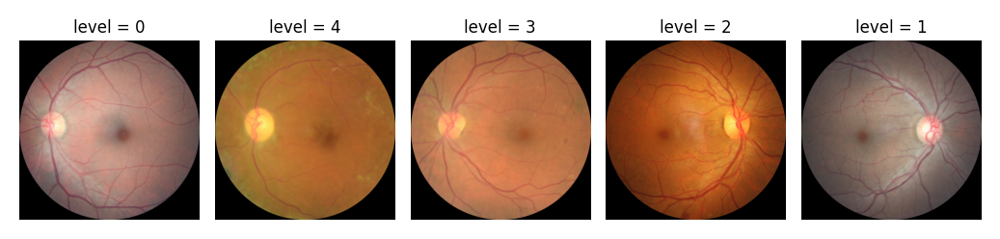

In [33]:
images_name = ['6581_left', '3028_left', '26127_right', '17355_left', '7038_right']
df_tmps = df_test[df_test.image.isin(images_name)]
df_tmp, labels = df_tmps['filename'], df_tmps['level'].tolist() 

images = load_EyePAC(data_dir, df_tmp, tensor=False)     
images_plot  = plot_transform(cfg, images, tensor=False)     

plot_EyePACS(images_plot, labels, size=(6,6))

In [34]:
ts_img = test_transform(cfg, images, pil_tensor=False) #resize, ToTensor->range(0,1), CenterCrop, Normalization
ts_img = ts_img.float() # from torch.DoubleTensor to torch.FloatTensor
ts_img = ts_img.to(device)
print(ts_img.shape)

res_preds = F.softmax(baseline_resnet(ts_img).data.cpu(), 1)
dense_bagnet_pred  = F.softmax(dense_bagnet(ts_img).data.cpu(), 1)  
sparse_bagnet_pred = F.softmax(sparse_bagnet(ts_img).data.cpu(), 1) 

torch.Size([5, 3, 512, 512])


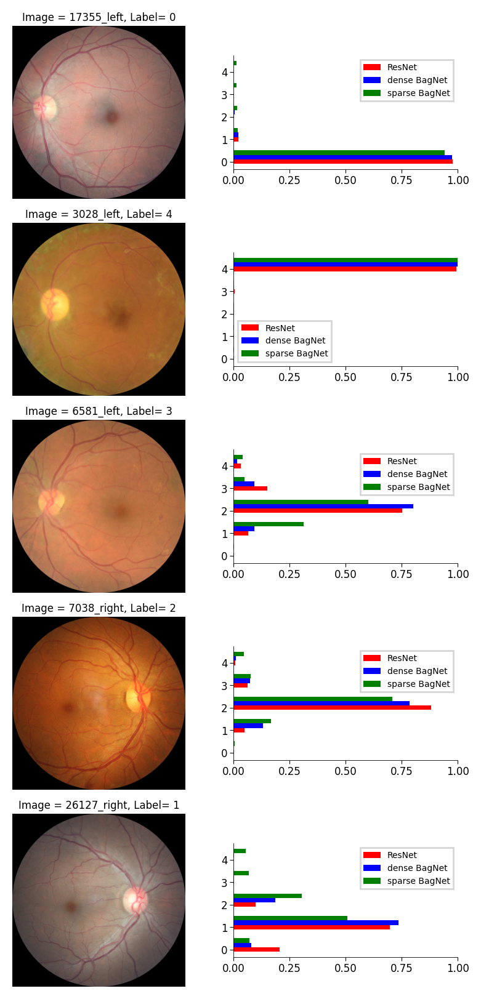

In [35]:
proba = [res_preds, dense_bagnet_pred, sparse_bagnet_pred]
description = ['ResNet', 'dense BagNet', 'sparse BagNet']
result = plot_probabilities(images_plot, df_tmps, proba, description, binary=False, on_same_plot=True, size=(4,8))

In [36]:
mode = ['bilinear', 'nearest']
dense_sparse_model = {'dense':dense_bagnet, 'sparse': sparse_bagnet}
heatmap, preds = get_feature_maps_from_inference(dense_sparse_model, ts_img)
image_plot_ts_img = [images_plot, ts_img]

# dense_result => images dense_feature_map -> class wise feature bagnet fmap
dense_result, sparse_result, resnet_result = get_bagnet_heatmap_and_GradCAM(baseline_resnet, heatmap, image_plot_ts_img, mode='bilinear', 
                                                                                    cmap='RdBu_r', dilation=0.5, percentile=99, alpha=.25)

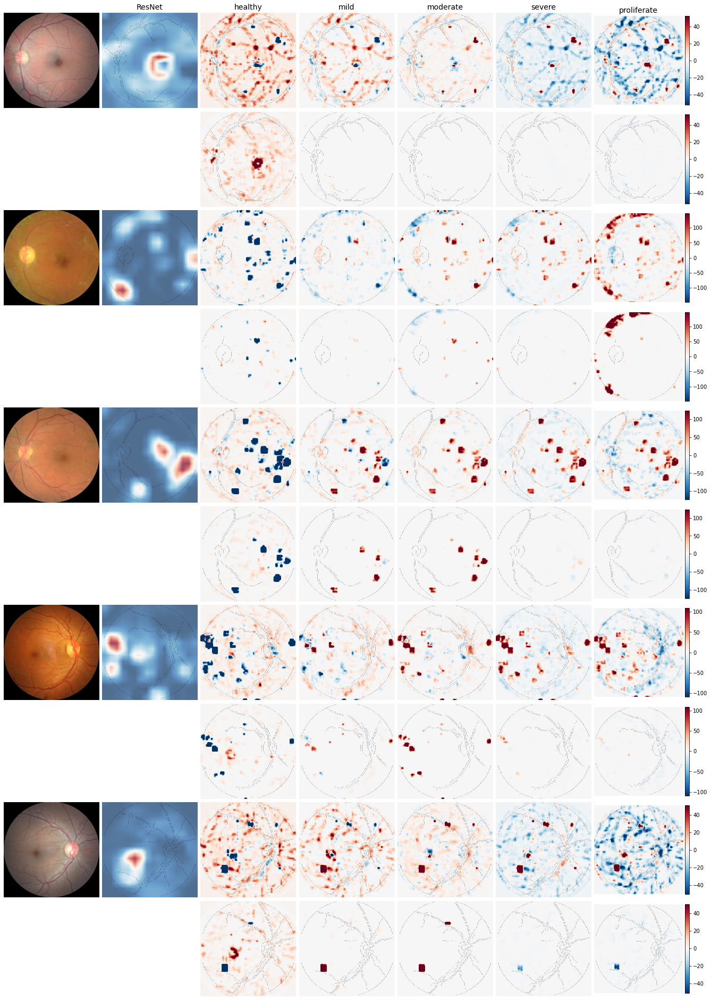

In [37]:
fs = 14
size = (18, 26)

results = (dense_result[0], sparse_result[0], resnet_result)
plot_multi_class_GradCAM_heatmap(images_plot, results, df_tmps, size=size, color_map=True, bag_alpha=.25, cam_alpha=.7, font_size=fs)